In [ ]:
# Greatest Common Divisor of Strings

# For two strings s and t, we say "t divides s" if and only if s = t + t + t + ... + t + t (i.e., t is concatenated with itself one or more times)
# Given two strings str1 and str2, return the largest string x such that x divides both str1 and str2.


# (1) read
# (2) example
# abab   -> ab, abab can divide this.
# ababab -> ab can.
# (abab, ababab) -> ans = "ab"

# abab       -> ab, abab           can divide this.
# ababababab -> ab, abab, abababab can.
# ans: "abab"

# (3) brute force
# Assume lengths are N, M
# time: N * (N + M) -> Can be: min(N, M) * (N + M)
# space: N -> Can be: min(N,)


# (4) optize

# (5) walk through
# for each divider candidate of str1
#   check if it is divider of str1
#   check if it is divider of str2

# (6) implement

def is_divider(string, divider):
    if len(string) % len(divider) != 0:
        return False
    for idx, char in enumerate(string):
        divider_idx = idx % len(divider)
        if divider[divider_idx] != char:
            return False
    return True

def largest_common_divider(str1, str2):
    max_divider_len = min(len(str1), len(str2))
    for end_idx in range(max_divider_len, 0, -1): # end_idx = 2,1
    # for end_idx in range(len(str1), 0, -1):
        divider = str1[:end_idx]
        if not is_divider(str1, divider):
            continue
        if not is_divider(str2, divider):
            continue
        
        return divider
    return ""


# (7) test
assert is_divider("abab", "abab") is True
assert is_divider("abab", "ab") is True
assert is_divider("abab", "a") is False
assert is_divider("aba", "ab") is False

assert largest_common_divider("ab", "abab") == "ab"
assert largest_common_divider("ab", "a") == ""



In [ ]:
# Kids With the Greatest Number of Candies

# There are n kids with candies. You are given
# - an integer array candies, where each candies[i] represents the number of candies the ith kid has, and
# - an integer extraCandies, denoting the number of extra candies that you have.

# Return a boolean array result of length n, 
# where result[i] is true if, after giving the ith kid all the extraCandies, they will have the greatest number of candies among all the kids,
#                 or false otherwise.

# Note that multiple kids can have the greatest number of candies.

# (1) Read

# (2) Example
# n = 3
# [1,2,3], 1

# -> [f, t, t]

# (3) bruite force
# 1st path -> Find max #
# 2ns path -> Append to return array

# time = O(N)
# space = O(1)

# (4) Optimie -> N/A

# (5) Walk though
# 1st path -> Find max #
# Initiate return array
# 2ns path -> check and append t/f to the array


# (6) implement


def can_reach_greatest(candies, extraCandies):
    max_num = max(candies)

    list_greatest_reachable = []

    for num_candy in candies:
        reachable = max_num <= num_candy + extraCandies
        list_greatest_reachable.append(reachable)
    
    return list_greatest_reachable


# (7) test
assert can_reach_greatest([0, 1, 2], 1) == [False, True, True]

In [ ]:
# Can Place Flowers

# You have a long flowerbed in which some of the plots are planted, and some are not. However, flowers cannot be planted in adjacent plots.
# Given an integer array flowerbed containing 0's and 1's, where 0 means empty and 1 means not empty, and an integer n, return true if n new flowers can be planted in the flowerbed without violating the no-adjacent-flowers rule and false otherwise.

# (1) Read

# (2) Example
# [1, 0, 1], 1 -> False

# (3) brute force
# greedy approach
# time = N
# space = 1

# (4) optiize

# (5) walkthrough
# for each idx,
#    if plantable -> rem_num -= 1, idx += 2
#    otherwise    -> idx += 1
# return True if rem_num = 0

# (6) implment
def is_plantable(flowerbed, idx):
    if 1 <= idx and flowerbed[idx-1] == 1:
        return False
    
    if idx <= len(flowerbed) - 2 and flowerbed[idx+1] == 1:
        return False

    return flowerbed[idx] == 0


def plant_flowers(flowerbed, num): # num = 2->1->0
    curr_idx = 0 # 0->2
    while curr_idx <= len(flowerbed) - 1: # 0 - 2
        if is_plantable(flowerbed, curr_idx):
            num -= 1
            if num == 0: return True
            curr_idx += 2
        else:
            curr_idx += 1

    return False

# (7) test
# General cases - check logic
assert is_plantable([1,0,0], 1) is False
assert is_plantable([0,0,1], 1) is False
assert is_plantable([0,1,0], 1) is False
assert is_plantable([0,0,0], 1) is True

# right end - check runtime error
assert is_plantable([0, 0], 0) is True
# left end - check runtime error
assert is_plantable([0, 0], 1) is True


assert plant_flowers([1,0], 1) is False
assert plant_flowers([0,0,0], 2) is True

In [ ]:
# Reverse vowels of a string

# Given a string s, reverse only all the vowels in the string and return it.
# The vowels are 'a', 'e', 'i', 'o', and 'u', and they can appear in both lower and upper cases, more than once.

# (1) Read

# (2) Examples

# s = asde
# -> ea

# s = asdee # two vowels
# -> easdea

# s = Asde # upper cases
# -> edsA


# leetcode       (vowels = eeoe)
# -> leotcede

# (3) Bruite force

# s = leetcode
# left : 0 -> 1e <swap>  -> 2e <swap> -> collide!
# right: 7e      <swap>  -> 5o <swap> -> collide!
# char array:                leetcode    loetcede

# time: N + N = N
# space: N

# (4) No optimization

# (5) Walk through
# left, right pointers
# Iteration: Move them until they meet
#    If vowel, swap them in the char array
# return concatanated string of char array

# (6) Implementation
UNCAPITALIZED_VOWELS = set(["a", "e", "i", "o", "u"])
CAPITALIZED_VOWELS = set(map(lambda char: char.upper(), UNCAPITALIZED_VOWELS))

def is_vowel(char):
    if char in UNCAPITALIZED_VOWELS:
        return True
    if char in CAPITALIZED_VOWELS:
        return True
    return False

def reversed_vowels(string): # xaye
    chars = list(string) # x,a,y,e -> x,e,y,a
    left, right = 0, len(string) - 1

    while left < right: # 0->1->2, 3->2
        left_char  = string[left]  # x->a
        right_char = string[right] # e

        if is_vowel(left_char) and is_vowel(right_char):
            chars[left], chars[right] = chars[right], chars[left]
            left += 1
            right -= 1
            continue
        
        if not is_vowel(left_char):
            left += 1

        if not is_vowel(right_char):
            right -= 1

    return "".join(chars)    


# (7) test case

# char is uncapitalized vowel
assert is_vowel("a") is True
# char is capitalized vowel
assert is_vowel("A") is True
# char is not [|un]capitalized vowel
assert is_vowel("x") is False

assert reversed_vowels("xaye") == "xeya"
assert reversed_vowels("xAye") == "xeyA"



In [ ]:
# Reverse Words in a String

# Given an input string s, reverse the order of the words.
# A word is defined as a sequence of non-space characters. The words in s will be separated by at least one space.

# Return a string of the words in reverse order concatenated by a single space.

# Note that s may contain leading or trailing spaces or multiple spaces between two words. The returned string should only have a single space separating the words. Do not include any extra spaces.


# (1) Read

# (2) Example
# "I know you" -> "you know I"
# "I  know  you" -> "you know I"
# "  I know you   " -> "you know I"

# (3) Bruite force
# words = []
# words << I << know << you ----> [I, know, you]
# words.reverse()
# conatanate words in a reversed order

# time = O(N)
# space = O(N)


# (4) Optimize
# "I know you"
# ret << "I" << " "
# char_array = [k,n,o,w]
# ret << w, o, n, k
# ...
# reverse ret

# time = O(N)
# space = O(N)


# Optimize 2
# "I know you"
# 1st path: word_start_idxes = [0, 2, 7]
# 2nd path:
# chars = []
# 7 -> chars << y,o,u
# chars << " "
# 2 -> chars << k,n,o,w
# chars << " "
# 0 -> chars << I
# return " ".join(chars)

# time = O(N)
# space= O(N)


# (5) Implement

def get_word_start_indexes(string):# "a b"
    indexes = [] # 0,2
    for idx, char in enumerate(string): #0a, 1 , 2b
        if 0 < idx and string[idx-1] != " ":
            continue
        if string[idx] == " ":
            continue
        indexes.append(idx)
    return indexes

def reversed_words(string): # ab cd
    word_start_indexes = get_word_start_indexes(string) #[0,3]

    chars = []# c,d," ",a,b," "
    for idx in range(len(word_start_indexes)-1, -1, -1): # range(1, -1, -1) -> 1,0*
        word_start_index = word_start_indexes[idx] # 0
        curr_idx = word_start_index # 2
        while curr_idx < len(string) and string[curr_idx] != " ": # b
            chars.append(string[curr_idx])
            curr_idx += 1

        if idx != 0:
            chars.append(" ")
    
    return "".join(chars)

# (6) Test
# general case
assert get_word_start_indexes("ab cd") == [0, 3]
# separator is multiple spaces
assert get_word_start_indexes("a  b") == [0, 3]
# has leading spaces
assert get_word_start_indexes("  c") == [2]
# hjtrailing spaces
assert get_word_start_indexes("d  ") == [0]

# general one
assert reversed_words("ab cd") == "cd ab"
# multiple separators
assert reversed_words("a  b") == "b a"
# leading spaces
assert reversed_words("  c") == "c"
# trailing spaces
assert reversed_words("c  ") == "c"

In [ ]:
# Increasing Triplet Subsequence

# Given an integer array nums, return true if there exists a triple of indices (i, j, k) such that i < j < k and nums[i] < nums[j] < nums[k].
# If no such indices exists, return false.

# (1)Read

# (2)Example
# 1,2,3 -> True
# 1,3,2 -> False
# 1,0,2,3 -> True

# data input: array with length 0~

# (3)Brute force
# triple nested loop 
# time = O(N**3)
# space = O(1)

# (4) Optimize

# 1,0,2,1,3

# at index 4:
# 1,2(ends at index 2)
# 0,2(ends at index 2)


# 2,3,1,2,3

# 2 -> [2]
# 3 -> [2,3]
# 1 -> [2,3], [1]
# 2 -> x[2,3], [1,2], [2]
# 3 -> [2,3], [1,2,3]

# track (smallest number, second smallest number in the sequence)
# 2,3,1,2,3
# 
# 2: (2, None) <- 
# 3: (2, 3) <- 2 < 3 < None. So update on 2nd_smallest
# 1: (1, 3) <- 1 < 2.        So update smallest.
# 2: (1, 2) <- 1 < 2 < 3.    So update 2nd_smallest
# 3: 2 < 3. So return True

# time  = O(N)
# space = O(1)


# (5) Walk through
# smallest = None, 2nd_smallest = None
# For each num,
#    - if 2nd_smallest < num, return True
#    - update smallest or 2nd_smallest
# return False


# (6) Implement

def has_increasing_triplet(nums): # [1,2,0]
    min_num, second_min = None, None # 0, 1
    for num in nums: #1->2->0->1->2*
        if second_min is not None and second_min < num:
            return True

        if min_num is None or num <= min_num:
            min_num = num
            continue

        if second_min is None or num <= second_min:
            second_min = num

    return False

# (7) Test
assert has_increasing_triplet([1,2,3]) is True
assert has_increasing_triplet([1,2,0]) is False
assert has_increasing_triplet([1,2,0,1,2]) is True

# when there is only one element
assert has_increasing_triplet([]) is False
# when there is only two element
assert has_increasing_triplet([1]) is False
# when there is only three element
assert has_increasing_triplet([1,2]) is False


In [ ]:
# String Compression

# Given an array of characters chars, compress it using the following algorithm:

# Begin with an empty string s. For each group of consecutive repeating characters in chars:

# If the group's length is 1, append the character to s.
# Otherwise, append the character followed by the group's length.
# The compressed string s should not be returned separately, but instead, be stored in the input character array chars.
# Note that group lengths that are 10 or longer will be split into multiple characters in chars.

# After you are done modifying the input array, return the new length of the array.

# You must write an algorithm that uses only constant extra space.

# Example 1:
# Input: chars = ["a","a","b","b","c","c","c"]
# Output: Return 6, and the first 6 characters of the input array should be: ["a","2","b","2","c","3"]
# Explanation: The groups are "aa", "bb", and "ccc". This compresses to "a2b2c3".

# Example 2:
# Input: chars = ["a"]
# Output: Return 1, and the first character of the input array should be: ["a"]
# Explanation: The only group is "a", which remains uncompressed since it's a single character.

# Example 3:
# Input: chars = ["a","b","b","b","b","b","b","b","b","b","b","b","b"]
# Output: Return 4, and the first 4 characters of the input array should be: ["a","b","1","2"].
# Explanation: The groups are "a" and "bbbbbbbbbbbb". This compresses to "ab12".


# (1) Read
# (2) Examples

# chars = [a,b,b,b,c,c,d,d,d,d,d,d,d,d,d,d,d(10 times)]
# reset chars array << a << b << 3 << c << 2 << d << 1 << 0

# Return len(chars array)

# (3) Brute force
# Traverse chars with counting

# [a,b,b,b,d,d,d,d,d,d,d,d,d,d,d(10 times)]
# encryped = []
# (curr_char, curr_cnt) = (a, 1)
# append a to encryped
# (curr_char, curr_cnt) = (b, 3)
# append b
# append 3
# (curr_char, curr_cnt) = (d, 10)
# append d
# append 1
# append 0

# Then empty given chars array
# Then append all elements in encryped to given chars array


# time = N
# space = N (for encrypted)

# (4) Optimize space
# No "encrypted" array
# Update the given char array
# Finally, remove remaiing tail elements from tail.

# time  = O(N)
# space = O(1)

# (5) Walk through
# for char in char_array
#     when char changes,
#        do the encryption
#        update char_array
# remove tails elements of char_array

# (6) Implement


class CharGroup:
    def __init__(self, char, cnt):
        self.char = char
        self.cnt = cnt

    def add(self):
        self.cnt += 1

########## Noticed that I don't need this.
# def pop_tails(arr, removed_from_index):
#     removed_cnt = len(arr) - removed_from_index
#     for _ in range(removed_cnt):
#         arr.pop()

def mutate_char_array(chars, next_updated_idx, char_group): # arg: [xxx], 2, (b,2)
    ########## Noticed that I don't need this.
    # assert next_updated_idx <= len(chars)
    # if len(chars) == next_updated_idx:
    #     chars.append(None)
    chars[next_updated_idx] = char_group.char
    next_updated_idx += 1
    
    if 1 < char_group.cnt:
        for cnt_char in str(char_group.cnt):
            ########## Noticed that I don't need this.
            # assert next_updated_idx <= len(chars)
            # if len(chars) == next_updated_idx:
            #     chars.append(None)
            chars[next_updated_idx] = cnt_char
            next_updated_idx += 1
    return next_updated_idx


def compress_chars(chars): # [a,1,b]
    if len(chars) == 0:
        return 0

    next_updated_idx = 0 # ->2
    char_group = CharGroup(chars[0], 1)# (a, 1) -> (b, 1) -> (b, 2)


    for idx in range(1, len(chars)): # 1->2*
        char = chars[idx] # b->b*

        if char == char_group.char:
            char_group.add()
        else:
            next_updated_idx = mutate_char_array(chars, next_updated_idx, char_group) # arg: [xxx], 0, (a,1)
            char_group = CharGroup(char, 1) 
    
    next_updated_idx = mutate_char_array(chars, next_updated_idx, char_group) # arg: [xxx], 2, (b,2)

    ########## Noticed that I don't need this.
    # pop_tails(chars, next_updated_idx)
    # return len(chars)

    return next_updated_idx



# (7) test
arr = [1,2,3]
pop_tails(arr, 2)
assert arr == [1,2]
arr = [1,2,3]
pop_tails(arr, 1)
assert arr == [1]

chars = ["a", "b", "b"]
assert compress_chars(chars) == 3
assert chars == ["a", "b", "2"]

chars = ["a"] + ["b"] * 10
assert compress_chars(chars) == 4
assert chars == ["a", "b", "1", "0"]

chars = []
assert compress_chars(chars) == 0
assert chars == []

In [ ]:
# Delete the Middle Node of a Linked List

# You are given the head of a linked list. Delete the middle node, and return the head of the modified linked list.

# The middle node of a linked list of size n is the ⌊n / 2⌋th node from the start using 0-based indexing, where ⌊x⌋ denotes the largest integer less than or equal to x.

# e.g.
# For n = 1, 2, 3, 4, and 5, the middle nodes are 0, 1, 1, 2, and 2, respectively.

# (1) Read

# (2) Examples
# head->None
#    RETURN NULL (edge case)
# head->11 
#    mid_idx = 0 // 2 = 0. So remove 11, head->Null
# head->11->22
#    mid_idx = 1 // 2 = 0. So remove 11, head->22
# head->11->22->33
#    mid_idx = 3 // 2 = 1. So remove 22, head->11->33

# Note:
# how many nodes?
# edge case of removing head node. -> use pseudo node.

# Input:
# Node (nullable)

# (3) Brute force
# Count nodes, and find middle idx, and reach there and remove it.
# time  = O(N)
# space = O(1)

# (4) No optimization.

# (5) Walk through
# Insert pseudo node
# Count nodes
# Find middle idx
# Reach there and remove it
# Return head.next

# (6) Implement
# Definition for singly-linked list.
class ListNode:
    def __init__(self, val=0, next=None):
        self.val = val
        self.next = next

def count_nodes(head):
    curr = head
    cnt = 0
    while curr is not None:
        cnt += 1
        curr = curr.next
    return cnt

# pseudo_head is not None
# There is always a node at the given idx.
def remove_node(pseudo_head, idx):
    curr = pseudo_head # curr=11

    # !!!!! Learned from answer that this can be simplified.
    # while 1 <= idx: # idx=0
    #     curr = curr.next
    #     idx -= 1

    # assert idx == 0
    # curr.next = curr.next.next
    for _ in range(idx):
        curr = curr.next
    curr.next = curr.next.next


def delete_middle(head): # head->11->22->33
    if head is None:
        return None

    temp = head
    head = ListNode(None) # pseudo node
    head.next = temp

    # Now, head->Pse->11->22->33
    cnt = count_nodes(head.next) # 3
    mid_idx = cnt // 2 # 1

    remove_node(head, mid_idx)
    # Now, head->Pse->11->33

    return head.next


# (7) Test

## #count_nodes
assert count_nodes(None) == 0
n1 = ListNode(11)
assert count_nodes(n1) == 1
n2 = ListNode(22)
n1.next = n2
assert count_nodes(n1) == 2
n3 = ListNode(33)
n2.next = n3
assert count_nodes(n1) == 3

# #remove_node
# remove_node(Psuedo*->11,     0) => Psuedo->None
# remove_node(Psuedo*->11->22, 0) => Psuedo->22
# remove_node(Psuedo*->11->22, 1) => Psuedo->11


# #delete_middle
assert delete_middle(None) is None
assert delete_middle(ListNode(11)) is None
# assert delete_middle(head->11->22) => head->11
# assert delete_middle(head->11->22->33) => head->11->33

# Ref. https://qiita.com/kudojp/items/cff137389211aed91c70#%E4%BE%8B2-linked-list

In [ ]:
# Odd Even Linked List

# Given the head of a singly linked list, group all the nodes with odd indices together followed by the nodes with even indices, and return the reordered list.

# The first node is considered odd, and the second node is even, and so on.

# Note that the relative order inside both the even and odd groups should remain as it was in the input.

# You must solve the problem in O(1) extra space complexity and O(n) time complexity.


# 1. Read

# input: head of linked list

# 2. Examples

# head->1
# return head

# head->1->2
# return head

# head->1->2->3
# head->1->3->2
# return head

# head->1->2->3->4->5->6
# head->1->3->5->2->4->6
# return head

# 3. Brute force
# head->1->2->3->4->5->6
# traverse and creeate
#   odd_nodes  = [1, 3, 5]
#   even_nodes = [2, 4, 6]
# head->1->3->5->2->4->6
# return head

# time  = O(N)
# space = O(N)

# 4. Optimize
# time  = O(N)
# space = O(1)

# head->1->2->3->4->5->6
#       1---->3
#          2---->4                               # first_even_node = 2
#             3---->5
#                4---->6
#                   5--------> first_even_node(2)  because 5 is at the last odd index
#                      6-------->None              because 6 is at the last even index

# head->1->2->3->4->5
#       1---->3
#          2---->4                                # first_even_node = 2
#             3---->5
#                4------->None                    because 4 is at the last even index
#                   5--------> first_even_node(2) because 5 is at last odd index

# 5. Walk through
# Start with (first, second) = (1, 2), and first_even_node = 2
# Point to first.next = second.next
# Shift it by one
# 　　　Point as first.next = second.next
#      If first is at the last odd index, firxt.next = first_even_node
#      If first is at the last even index, firxt.next = None
# Return head


# 6. Implement


class ListNode:
    def __init__(self, val=0, next=None):
        self.val = val
        self.next = next


def reorder(head): # 1->2->3->4|1->3->4,2->4|1->3->2->4->None
    if head is None: return None
    if head.next is None: return head

    first_even_node = head.next # 2
    first, second = head, head.next # 4, null
    index_of_first = 1 # 4

    while second.next is not None:
        first.next = second.next
        first = second
        second = first.next
        index_of_first += 1

    # Here, first and second are at the last 2 indexes.
    
    for i in range(2):
        first_is_odd = index_of_first % 2 == 1
        if first_is_odd:
            first.next = first_even_node
        else:
            first.next = None

        if i == 0:
            first = second
            second = first.next
            index_of_first += 1
    
    return head

# 7. Test
# when list has 0 element
assert reorder(None) is None

# when list has 1 element
# assert reorder(head) is ListNode(head)

# general cases
# assert reorder(1->2->3)    == 1->3->2
# assert reorder(1->2->3->4) == 1->3->2->4


# ---------------------------------------------------------------------
# Review.
# Clean up and simplify my code after reading the answer.

def reorder(head): # 1->2->3->4|1->3->4,2->4|1->3->2->4->None
    if head is None: return None
    if head.next is None: return head

    last_odd_node = head
    first_even_node = head.next # 2
    first, second = head, head.next # 4, null
    first_is_odd = True

    while second.next is not None:
        first.next = second.next
        first = second
        second = first.next
        first_is_odd = not first_is_odd

    # Here, first and second are at the last 2 indexes.
    for node in [first, second]:
        if first_is_odd:
            node.next = first_even_node
        else:
            node.next = None
        first_is_odd = not first_is_odd
        
    return head


# ======================================================================
# 24/03/05

# Given the head of a singly linked list, group all the nodes with odd indices together followed by the nodes with even indices, and return the reordered list.

# The first node is considered odd, and the second node is even, and so on.

# Note that the relative order inside both the even and odd groups should remain as it was in the input.

# You must solve the problem in O(1) extra space complexity and O(n) time complexity.


# 1. Read
# def regrouped(head):
# head is None -> return None

# 2. Example
# head -> 1
# head -> 1

# head -> 1 -> 2
# head -> 1 -> 2

# 3. BF

# head -> 1 -> 2 -> 3 -> 4 -> 5 -> 6 -> 7
#         ^

# odd_head  -> None
# even_head -> None

# finally odd_head.tail -> even-head
# (I have to keep track of tail of odd_head!!!)

# time  = O(N)
# space = O(1)


# 4. No Optimize

# 5. Skip walk-through

class Node:
    def __init__(self, val):
        self.val = val
        self.next = None

# def regrouped(head):
#     if head is None or head.next is None:
#         return head

#     odd_head = head
#     even_head = head.next
#     curr = head.next.next # 3rd node
#     curr_idx = 3

#     odd_tail = odd_head # to be updated
#     odd_tail.next = None

#     even_tail = even_head # to be updated
#     even_tail.next = None

#     while curr is not None:
#         if curr_: # odd index
#             odd_tail.next = curr
#             curr = curr.next
#             curr_idx += 1
#             odd_tail = odd_tail.next
#             odd_tail.next = None
#         else: # even index
#             even_tail.next = curr
#             curr = curr.next
#             curr_idx += 1
#             even_tail = even_tail.next
#             even_tail.next = None

#     odd_tail.next = even_head
#     return odd_head


def regrouped(head):
    if head is None or head.next is None:
        return head

    odd_head = head
    even_head = head.next
    curr = head.next.next # 3rd node
    ###################################### You don't have to track curr_idx. curr_is_odd(boolean) is enough.
    curr_is_odd = True

    odd_tail = odd_head # to be updated
    # odd_tail.next = None

    even_tail = even_head # to be updated
    # even_tail.next = None

    while curr is not None:
        if curr_is_odd:
            odd_tail.next = curr
            curr = curr.next
            curr_is_odd = not curr_is_odd

            odd_tail = odd_tail.next
            # odd_tail.next = None
        else:
            even_tail.next = curr
            curr = curr.next
            curr_is_odd = not curr_is_odd

            even_tail = even_tail.next
            # even_tail.next = None

    ##################### You don't have to update tail.next = None all the time. This is enough.
    even_tail.next = None
    odd_tail.next = even_head
    return odd_head    

head = Node(1)
head.next = Node(2)
head.next.next = Node(3)
head.next.next.next = Node(4)
head.next.next.next.next = Node(5)

new_head = regrouped(head)
assert new_head.val == 1
assert new_head.next.val == 3
assert new_head.next.next.val == 5
assert new_head.next.next.next.val == 2
assert new_head.next.next.next.next.val == 4
assert new_head.next.next.next.next.next is None

In [ ]:
# Reverse linked list

# Given the head of a singly linked list, reverse the list, and return the reversed list.

# 1. Read
# input: head (nullable)

# 2. Example

# head->null    return null
# head->1       return 1
# head->1->2    return 2->1
# head->1->2->3 return 3->2->1

# 3. Bruite force


# head->1->2->3->4->5
# 　　　 f  s
# head->1<->2  3->4->5
#           f  s
# null<-1<->2<-3  4->5
# null<-1<->2<-3<-4  5
# null<-1<->2<-3<-4<-5
#                 f  s
# null<-1<-2<-3<-4<-5

# traverse (first, second)

# time  = O(N)
# space = O(1)

# 4. No optimzation

# 5. Walk through
# initiate first and second
# traverse till second is at the tails node
#      keep track of third node
# 　　　ref secnod -> first
#      only for head node, ref head -> null
# return xxx


# 6. Implement

def reversed(head):
    if head is None: return None

    first, second = head, head.next # 1, None

    while second is not None:
        third = second.next # None
        second.next = first
        first, second = second, third

    head.next = None
    return first


# 7. Test
## happy path
# assert　reversed(1->2->3) == 3->2->1

## edge cases
# assert　reversed(None) == None
# assert　reversed(1)    == 1
# assert　reversed(1->2) == 2->1


# ------------------------------------------------------------------
# Review


def reversed(head):
    if head is None: return None

    first, second = head, head.next
    head.next = None ############ This can be here.
    # I could notice this if I was careful when I noticed the bug when I was doing the walk-through of the code.


    while second is not None:
        third = second.next
        second.next = first
        first, second = second, third

    return first

In [ ]:
# Reverse linked list (2nd time)

# Examples
# head->1->2->3
# should return head->3->2->1

# head->1->2->3->None
# None<-1  2->3->None
# None<-1<-2  3->None
# None<-1<-2<-3

# Opimization
# head    ->  1 -> 2 -> 3
#           curr           # prev=None ### start from this.
# head    ->  1x   2 -> 3  # curr.next=prev=None
#           prev  curr     # shifted
# head    ->  1x<- 2    3  # curr.next=prev=1
#                 prev  curr
# head    ->  1x<- 2 <- 3
#                       prev  curr=None!!!!


# shift (prev, curr) till end:
#    curr,next = prev

def reverse(head):
    prev, curr = None, head

    while curr is not None:
        temp = curr.next
        curr.next = prev

        prev, curr = curr, temp
    
    return prev


In [ ]:
# Move zeros
# Did physical white boarding (See below.)

def moveZeroes(self, nums: List[int]) -> None:
    l, r = 0, 0
    while l < len(nums):
        #### (1) l and r are completely swapped ....
        if nums[l] != 0:
            # (2) I was unconscious that this cannot be nums[l], nums[r] = nums[r], 0
            # Given [1], when l = r = 0, I swap the exact same number 1.
            nums[l], nums[r] = nums[r], nums[l]
            r += 1
        l += 1
    return nums



# -----------------------------------------------------------------
# Review
# I noticed that I canot
def moveZeroes(self, nums: List[int]) -> None:
    left = 0
    for right, right_num in enumerate(nums):
        if right_num != 0:
            # Same as above.
            nums[left], nums[right] = nums[right], nums[left]
            left += 1
        
    return nums

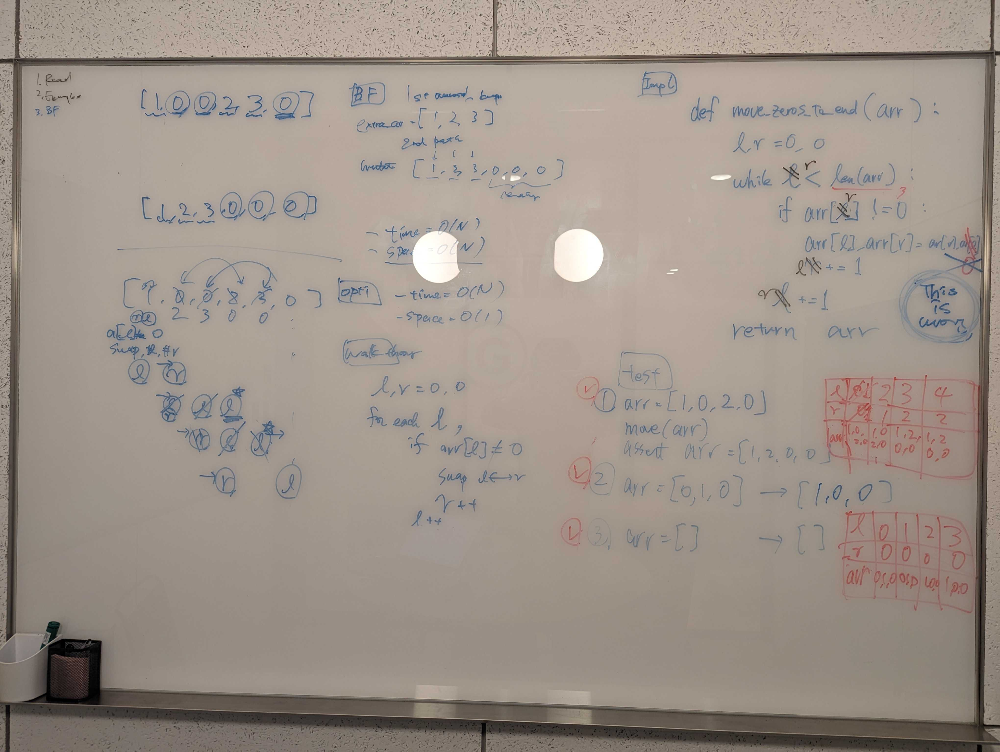!

In [ ]:
# Is subsequence
# Did physical white boarding (See below.)

def isSubsequence(self, s: str, t: str) -> bool:
    if len(s) == 0:
        return True 
    
    ps = 0
    for char_t in t:
        if s[ps] == char_t:
            ps += 1
            if ps == len(s):
                return True
    return False

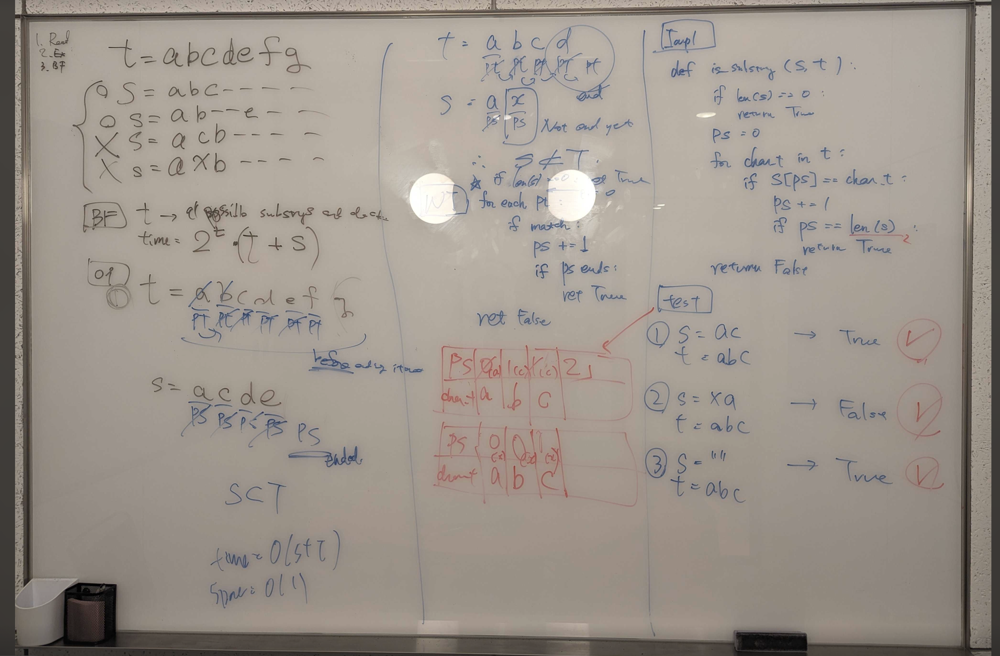

In [ ]:
# Maximum Twin Sum of a Linked List

# In a linked list of size n, where n is even, the ith node (0-indexed) of the linked list is known as the twin of the (n-1-i)th node, if 0 <= i <= (n / 2) - 1.
# For example, if n = 4, then node 0 is the twin of node 3, and node 1 is the twin of node 2. These are the only nodes with twins for n = 4.
# The twin sum is defined as the sum of a node and its twin.

# Given the head of a linked list with even length, return the maximum twin sum of the linked list.


# 1. Read
# head->1->2->3->4
# 1+4=5
# 2+3=5
# return max(5,5)=5

# def max_twin_sum(head)

# 2. Examples
# head -> 1 -> 2 -> 5 -> 6 -> 10 -> 11
# 1+11
# 2+10
# 5+6
# return 12

# 3. Bruite Force
# create array [1,2,3,4]
# use 2 pointers, left, right
# move both to center while tracking max_sum

# time  = O(N)
# space = O(N)

# 4. Optimize -> did not come up.
# head->1->2->3->4

#         *
# 1   2   5

# 11  10  6
# *

# 5. Walk though
# create array [1,2,3,4]
# use 2 pointers, left, right
# move both to center while tracking max_sum

# 6. Implement

def list_to_array(head): #1->2
    arr = [] # [1,2]
    curr = head
    while curr is not None: # None
        arr.append(curr.val)
        curr = curr.next
    return arr
        

def max_twin_sum(head): # 1->4->2->11
    if head is None: return None

    arr = list_to_array(head)  #[1,4,2,11]
    left, right = 0, len(arr) - 1
    max_sum = 0 # 12
    while left < right:  # 2, 1
        max_sum = max(max_sum, arr[left] + arr[right]) # max(12, 6) = 12
        left += 1
        right -= 1
    return max_sum

# 7. Test
# assert list_to_array(head->None) == []       # okay
# assert list_to_array(head->1->2) == [1,2]    # okay

# assert max_twin_sum(head->None) is None      # okay
# assert max_twin_sum(head->1->4->2->11) == 12 # okay


# -------------------------------------------------------------------------

# 4. Optimize again

# I could not come up.

# *  
# 1   2   5  8

# 11  10  6  5
# *   p


# *  
# 2   5  8

# 10  6  5
#        *

# -------------------------------------------------------------------------
# Read answer.

# 4. Optimize
# I compromise. I mutate the linked list.

# 1st path: reverse second half of linked list.
# 2nd path: use 2 pointers. Update max_sum in each iteration.

# 5. Walk-through

# Count #nodes
# 1st path:
#   Reach index=n/2
#   Reverse latter half from there.
# 2nd path:
#   Reach index=n/2
#   Set left, right = 1st, n/2-nd
#   Init max_sum=None
#   Shift them while updating max_sum
# return max_sum

def count(head):
    curr = head
    cnt = 0
    while curr is not None:
        cnt +=1 
        curr = curr.next
    return cnt

# head is not None and 2 <= num_nodes
def second_half_head(head, num_nodes): # head->1->2, num_nodes=2
    curr = head # 2
    for _ in range(num_nodes/2): # 1 time
        curr = curr.next
    return curr

# head is not None
# returns head of reversed list
def reverse_list(head): # None<-1<-2<-3
    first, second = head, head.next # 3, None
    head.next = None

    while second is not None:
        third = second.next # None
        second.next = first
        first = second
        second = third
    return first


def max_twin_sum(head): # head->1->2->3<-10
                        #             ↓
                        #             None
    if head is None: return None

    num_nodes = count_list(head) # 4

    second_half_head = second_half_head(head, num_nodes) # 3
    reversed_list_head = reverse_list(second_half_head) # 10

    max_sum = None # 11
    left, right = head, reversed_list_head # 3. None
    while right is not None:
        twin_sum = left.val + right.val # 5
        if max_sum is None:
            max_sum = twin_sum
        else:
            max_sum = max(max_sum, twin_sum)
        
        left, right = left.next, right.next

    # return twin_sum
    # NO!!!!!!!!!!!
    return max_sum


# Sophisticate this.
# - I don't have to know num_nodes. I can know ``first_half_tail` node with 2 pointers (`fast` and `slow`).
# - When reversing a linked list, use (prev, curr) rather than (first, second) pointers.
# Example:

# Step1
# head->1 -> 2 -> 3 -> 33 -> 22 -> 11
#       s,   f
#            s　　      f
#                 s　　             f

# Step2
# head->1 -> 2 -> 3 -> 33 -> 22 -> 11
#                pr    cu

# point prev to None
# head->1 -> 2 -> 3x    33 -> 22 -> 11       # TODO: take care.
#                 pr    cu    temp
# head->1 -> 2 -> 3x <- 33    22 -> 11
#                       pr    cu    temp
# head->1 -> 2 -> 3x <- 33 <- 22    11
#                             pr    cu   temp
# head->1 -> 2 -> 3x <- 33 <- 22 <- 11
#                                   pr    cu is None!

# Step3: traverse in this way:
#        head -------><------- prev



def max_twin_sum(head):
    if head is None: return None
    assert head.next is not None # becasue number of nodes is 2+

    slow, fast = head, head.next
    while fast.next is not None:
        slow = slow.next
        fast = fast.next.next
    # Now slow is the tail node of the first half.

    prev, curr = slow, slow.next
    prev.next = None
    while curr is not None:
        temp = curr.next
        curr.next = prev
        prev, curr = curr, temp
    # Now, prev is at the tail

    max_twin_sum = 0
    left, right = head, prev

    while right.next is not None:
        twin_sum = left.val + right.val
        max_twin_sum = max(max_twin_sum, twin_sum)
        left = left.next
        # Not: right = right.prev !!!!!!!!!!!!!!!!!!!!!!!!!!1
        right = right.next
    

    # Don't return twin_sum!!!!!!!!!!!!!!!!
    return max_twin_sum

In [ ]:
# You are given an integer array nums and an integer k.
# In one operation, you can pick two numbers from the array whose sum equals k and remove them from the array.

# Return the maximum number of operations you can perform on the array.

# 1. Read
# arr = [1, 2, 4, 0, 3], k = 5
# def num_pairs(arr, k):


# 2. Example
# arr = [1, 2, 4, 0, 3], k = 5
# arr = [-, 2, -, 0, 3], k = 5 (1 pairs)
# arr = [-, -, -, 0, -], k = 5 (2 pairs)

# 3. BF
# for first_num
#   for second_num
#       check the sum
#       optionally replace the elem
# time  = O(N**2)
# space = O(1). without replace O(N)

# 4. Optimize
# Use hash { key=num, val=cnt }
# for num
#    check if there is a pair, and reduce if found and increment pair_cnt
#    or if not, add it to hash
# return cnt

# time  = O(N)
# space = O(N)

# 5. Walk through ^

# 6. Implement
from collections import defaultdict

def num_pairs(arr, k): # [1,0,5,2,2], 3
    num_pairs = 0 # 1
    num_to_cnt = defaultdict(int) # {1:0, 0:1, 5:0, 2:1}

    for num in arr: # 2
        pair_found = 1 <= num_to_cnt[k - num] # [k-num=3-2=1]

        if pair_found:
            num_to_cnt[k - num] -= 1
            num_pairs += 1
        else:
            num_to_cnt[num] += 1
    
    return num_pairs


# 7. Test
assert num_pairs([1,0,5,2,2], 3) == 1
assert num_pairs([], 3) == 0


# ------------------------------------------------------
# Review
def num_pairs(arr, k): # [1,0,5,2,2], 3
    num_pairs = 0 # 1
    num_to_cnt = defaultdict(int) # {1:0, 0:1, 5:0, 2:1}

    for num in arr: # 2
        ####### This makes code readable, and walk-through much easier.
        complement = k - num
        pair_found = 1 <= num_to_cnt[complement]

        if pair_found:
            num_to_cnt[complement] -= 1
            num_pairs += 1
        else:
            num_to_cnt[num] += 1
    
    return num_pairs

In [ ]:
# Maximum Average Subarray I

# You are given an integer array nums consisting of n elements, and an integer k.

# Find a contiguous subarray whose length is equal to k that has the maximum average value and return this value. Any answer with a calculation error less than 10-5 will be accepted.

# 1. Read
# nums=[1, 3, 4], k = 2
#       *  *    -> (1+3)/2=2
#          *  * -> (3+4)/2=3.5
# return 3.5

# def max_avg(nums, k)

# 2. Example
# nums=[1, 3, 4, 8, 9],  k = 3
#       *  *  *          -> 1+3+4=8  (-1+8)
#          *  *  *       -> 3+4+8=15 (-3+9)
#             *  *  *    -> 4+8+9=21
# return 3.5

# 3. BF
# sliding window.
# (k=0 -> edge case)
# left, right = 0, k-1
# curr_sum

# shift (left, right)
#     update curr_sum 
#     track max_sum

# return max_sum / k

# time  = O(N)
# space = O(1)

# 4. No optimization

# 5. Walk through
# (k=0 -> edge case)
# (len(arr)<k -> edge case)
# left, right = 0, k-1
# curr_sum = sum(arr[0] ~ arr[k-1])

# shift (left, right)
#     update curr_sum 
#     track max_sum
# return max_sum / k


# 6. Implementation
def max_avg(nums, k): # [1,2,3,4], 3
    if k == 0 or len(nums) < k: # 4 < 3
        return None
    
    left, right = 0, k - 1 # 1,3
    curr_sum = 0           # 9
    for i in range(k):
        curr_sum += nums[i]
    
    while right+1 <= len(nums)-1:  # 3+1 <= 3
        curr_sum = curr_sum - nums[left] + nums[right + 1] # 6-1+4=
        left += 1
        right += 1
    
    return curr_sum / k

# 7. Test
assert max_avg([1,2,3,4], 3) == 3
assert max_avg([4,3,2,1], 3) == 3 ########### I shoudl have written this.
assert max_avg([1,2,3], 0) is None
assert max_avg([1], 2) is None

# -------------------------------------------------------
# Review

def max_avg(nums, k): # [1,2,3,4], 3
    if k == 0 or len(nums) < k: # 4 < 3
        return None
    
    curr_sum = 0
    for i in range(k):
        curr_sum += nums[i]

    left, right = 0, k - 1
    max_sum = curr_sum ################## I forgot to track max_sum
    
    # while right+1 <= len(nums)-1:
    for right in range(right+1, len(nums)):
        right += 1
        curr_sum = curr_sum - nums[left] + nums[right] # 6-1+4=
        left += 1
        max_sum = max(max_sum, curr_sum)
    
    return max_sum / k

In [ ]:
# Maximum Number of Vowels in a Substring of Given Length

# Given a string s and an integer k, return the maximum number of vowel letters in any substring of s with length k.
# Vowel letters in English are 'a', 'e', 'i', 'o', and 'u'.


# 1. Read
# s = "aiowa", k = 3


# 2. Example
# s = "a i x y o", k = 3

# 3. BF
# s = "a i x y o", k = 3
#      * * *       ->2 :-1(a)+0(y)
#        * * *     ->1 :-1(i)+1(o)
#          * * *   ->1

# time  = O(N)
# space = O(1)

# 4. No optimization

# 5. Walk through
# Define the first (left, right)
# Define curr_vowel_cnt and max_vowel_cnt
# For each window,
#    update curr_vowel_cnt
#    update max_vowel_cnt
# return max_vowel_cnt


# 6. Implement

VOWELS = ['a', 'e', 'i', 'o', 'u']

def is_vowel(char):
    return char in VOWELS


def max_vowel_cnt(string, k): # aixyo, 3
    if k == 0:
        return 0
    if len(string) < k:
        return None

    left, right = 0, k-1 # 0, 2

    curr_vowel_cnt = 0
    for i in range(k): # 0,1,2
        if is_vowel(string[i]): 
            curr_vowel_cnt += 1

    max_vowel_cnt = curr_vowel_cnt

    # left, right    = 0, 2 -> 1, 3 -> 2, 4
    # curr_vowel_cnt = 2->1->0->1
    # max_vowel_cnt  = 2->2

    while right + 1 <= len(string) - 1: # <=4
        if is_vowel(string[left]): # a->i
            curr_vowel_cnt -= 1
        left += 1
        right += 1
        if is_vowel(string[right]):
            curr_vowel_cnt += 1

        max_vowel_cnt = max(max_vowel_cnt, curr_vowel_cnt)

    return max_vowel_cnt


# 7. Test
assert max_vowel_cnt("aixyo", 3) == 2 # pass
assert max_vowel_cnt("a", 0) == 0     # pass
assert max_vowel_cnt("a", 3) == None  # pass

In [ ]:
# Removing Stars From a String

# You are given a string s, which contains stars *.
# In one operation, you can:

# Choose a star in s.
# Remove the closest non-star character to its left, as well as remove the star itself.
# Return the string after all stars have been removed.

# Note:
# The input will be generated such that the operation is always possible.

# 1. Read
# s = "a*xb*"
# a*xb*
# xb*
# x

# input: s(string)
# def remove_stars(string)

# 2. Examples
# a*bcx**
# a*bc*
# The order does not matter.

# 3. BF
# ------------wrong--------------
# a*bcz**
# 1st path: count #stars, and #non-stars
# 2nd path: get the first (#start - #non) chars
# Return string
# ------------wrong--------------

# traverse left<-----------------right
#    track #cnt_stars_not_canceled
#    if #stars_not_canceled == 0:
#       add that char to arr & decrement stars_not_canceled
#    else:
#       increment stars_not_canceled
# return string of chars

# a*xyzbc*
# stars_not_canceled=0
# [b,z,y,x]
# time = O(N)
# space = O(N)

# 4. No Optimization

# 5 Walk through
# cnt_stars_not_canceled = 0
# chars = []

# traverse left<-----------------right
#    char == *
#    char != *
#       cnt_stars_not_canceled == 0 
#       cnt_stars_not_canceled != 0
# return concatanated chars

# 6. Implement
def remove_stars(string):         # abc*de***
    chars = []                    # []a
    cnt_not_canceled_stars = 0    # 1->2->3->2->1->2->1->0

    for i in range(len(string)-1, -1, -1): # 8~0: 8->7->6->5->4->3->2->1->0
        char = string[i]          # *,*,*,e,d,*,c,b,a

        if char == "*":
            cnt_not_canceled_stars += 1
            continue

        if 0 < cnt_not_canceled_stars:
            cnt_not_canceled_stars -= 1
            continue
        
        chars.append(char)

    chars.reverse()
    return "".join(chars)

    # removed_string = "".join(chars) # a
    # removed_string.reverse()        # a
    # return removed_string           # a


# 7. Test
assert remove_stars("abc*de***") == "a"   # pass
assert remove_stars("xabc*de***") == "xa" # pass
assert remove_stars("") == ""             # pass


# ----------------------------------------------------------
# Review
# I should have split the test case.
# assert remove_stars("abc**") == "a" 
# assert remove_stars("abcd*e**") == "ab" 

###### I should have used stack!!!!!!!!!!!!!!!
# "abc**"
# stack[]<-a

# abcd*e**
# stack <-ab

def remove_stars(string):
    stack = []
    for char in string:
        if char == "*":
            stack.pop()
        else:
            stack.append(char)
    return "".join(stack)


In [ ]:
# Asteroid Collision

# We are given an array asteroids of integers representing asteroids in a row.

# For each asteroid, the absolute value represents its size, and the sign represents its direction (positive meaning right, negative meaning left). Each asteroid moves at the same speed.

# Find out the state of the asteroids after all collisions. If two asteroids meet, the smaller one will explode. If both are the same size, both will explode. Two asteroids moving in the same direction will never meet.


# 1. Read
# asteroid=[-1,+1,+2,-4] #### cannot be zero
# size = 1, dir = left
# size = 1, dir = right
# size = 2, dir = right
# size = 4, dir = left

# <-1,  1->, 2->, 4<-
# <-1,  1->, 4<-
# <-1,  4<-



# 2. Example
# asteroid=[-1,+1,+99,-2, -3, -100, -4,-5]
#       [-1,  ,   +1, +99,-100, -4, -5]
# <-1, 1->, 99->,  <-2, <-3, <-100, <-4, <-5
# <-1, 1->, 99->,  <-3, <-100, <-4, <-5
# <-1, 1->, 99->,  <-100, <-4, <-5
# <-1, 1->, <-100, <-4, <-5
# <-1, <-100, <-4, <-5
# [-1,-100,-4,-5]


# 3. BF
# [-1,+1,+99,-2, -3, -100, -4,-5]

# stack=[]
# []<- -1
# [-1]<- +1  (because left-dir and right-dir never collide )
# [-1,1]<- +99 (because right-dir and right-dir)
# [-1,1,99]<-x -2 breaks
# [-1,1,99]<-x -3 breaks
# [-1,1,x99] vs -100 (because 99 collides 100 and breaks)
# [-1,x1]<-  -100 (because 1　...same as above)
# [-1]   <-  -100 (because -1 and -100 never meet)
# [-1,-100]  <-  -4 (because -100 and -4 never meet)
# [-1,-100,-4]  <-  -5 (because -100 and -5 never meet)
# [-1,-100,-4,-5]

# complexity analysis
# time  = O(N)
# space = O(N)


# 4. No optimization

# 5. Walk through
# final_state = []
# Traverse each asteroid,
#     last asteroid vs new asteroid
#        no collision -> push new to final_state
#        or. new breaks
#        or. last breaks -> keep battling.
#        or. both break
# return final_state

# ast1 can be None
def will_collide(left_ast, right_ast):
    if left_ast is None:
        return False
    # return left_ast * right_ast < 0 ################ wrong!!!!!!!!!!!
    return 0 < left_ast and right_ast < 0


def final_state(asteroids): # [1,2]
    final_state = [] #[1] -> []
    # new_ast:  1->2
    # last_ast: None->1

    for new_ast in asteroids: #[1,2]
        while True:
            last_ast = None if len(final_state) == 0 else final_state[-1] # None->3->2->1->2

            if not will_collide(last_ast, new_ast): # 2,-2
                final_state.append(new_ast)
                break

            # collides
            if abs(last_ast) == abs(new_ast):
                final_state.pop()
                break
            elif abs(last_ast) > abs(new_ast):
                break
            else:
                final_state.pop()

    return final_state

# 7. Test
#################### I should have written these test cases!!!!!!!!!!!!!
assert will_collide(None,-1) is False
assert will_collide(2,1) is False ######################################## This should be false!!!!
assert will_collide(-2,-1) is False
assert will_collide(-2,1) is False
assert will_collide(2,-1) is True

# no collide
assert final_state([1,2]) == [1,2]
assert final_state([-1,-2]) == [-1,-2]
# collide
assert final_state([3,1-2]) == [3]
assert final_state([3,2,1,-2]) == [3]


# --------------------------------------------------------------------------------
# 8. Review

def final_state(asteroids): # [1,2]
    final_state = []

    for new_ast in asteroids: #[1,2]
        final_state = update_state(final_state, new_ast)

    return final_state

def update_state(final_state, new_ast):
    while True:
        if len(final_state) == 0:
            final_state.append(new_ast)
            break

        last_ast = final_state[-1]

        if not will_collide(last_ast, new_ast): # 2,-2
            final_state.append(new_ast)
            break

        # collides
        if abs(last_ast) == abs(new_ast):
            final_state.pop()
            break
        elif abs(last_ast) > abs(new_ast):
            break
        else:
            final_state.pop()
    return final_state


# ast1 cannot be None
def will_collide(left_ast, right_ast):
    return 0 < left_ast and right_ast < 0


# ==============================================================================
# 24/03/05


def final_state(asteroids):
    final_state = []
    for asteroid in asteroids:
        final_state = udpated_final_state(final_state, asteroid) ################ mutating this is enough.
    return final_state

def udpate_final_state(final,  ast):
    ######################################## Write this !!!!!!!!!!!!!!!!!!
    # final[-1]<-->  ast
    #    None         o   
    #    o            o  (No collide)
    #    o            x
    #    x            x  (Both collide)
    #    x            o                   -> Keep going.   

    while True:
        if len(final) == 0:
            final.append(ast)
            break
        
        tail = final[-1]
        if not collide(tail, ast):
            final.append(ast)
            break
    
        if abs(tail) > abs(ast):    # ast breaks
            break
        elif abs(tail) == abs(ast): # both breaks
            final.pop()
            break
        else:                       # tail breaks -> continue
            final.pop()
    return final


def collide(left, right):
    return 0 < left and right < 0

In [ ]:
# Product of Array Except Self


[1,3,4,5]
-> []


# Given an integer array nums, return an array answer such that answer[i] is equal to the product of all the elements of nums except nums[i].

# You must write an algorithm that runs in O(n) time and without using the division operation.

# 1. Read
# [1,2,3] -> return [6,3,2]
# []  -> None
# [1] -> None
# def products_of_others(arr):


# 2. Exmple
# [
#    22 * 33 * 44, (no 11)
#    11 * 33 * 44, (no 22)
#    11 * 22 * 44, (no 33)
#    11 * 22 * 33, (no 44)
# ]
# [11,22,33,44] -> and return array

# 3. BF
# get the toal product
# For each element, product = total_prod / that number(if this is zero, divide with 1)
# Return array of those

# time  = O(N)
# space = O(N) which is a returned array


# 4. Opimize
# [
#    -    * (22 * 33  * 44) (no 11)
#    (11) * -   * (33 * 44), (no 22)
#    (11  * 22) * -   * (44), (no 33)
#    (11  * 22  * 33) *  -, (no 44)
# ]


# [1,2,3,4]
# prods_before = [1*, 1,  2, 6]
# prods_after =  [24, 12, 4, 1*]
# prod_array =   [24, 12, 8, 6]

# time  = O(N)
# space = O(N)

# 5. Walk through
# build prods_of_before
# build prods_of_after
# build prods_of_others
# return prods_of_others


# 6. Implement

def products_of_others(arr): # [1,2,3]
    if len(arr) <= 1:
        return None

    # prods_of_before [1, 1, 2]
    # prods_of_after  [6, 3, 1]
    # prods_of_others [6, 3, 2]

    prods_of_before = [1] + [None] * (len(arr) - 1)
    for i in range(1, len(arr)): # 1~2
        prods_of_before[i] = prods_of_before[i-1] * arr[i-1] # 1 * 2

    prods_of_after = [None] * (len(arr) - 1) + [1]
    for i in range(len(arr)-2, -1, -1): # 1~0 : 0
        prods_of_after[i] = prods_of_after[i+1] * arr[i+1] # 3 * 2

    prods_of_others = []
    for i in range(len(arr)): #i=0~2: 0
        prod = prods_of_before[i] * prods_of_after[i]
        prods_of_others.append(prod)
    
    return prods_of_others

# 7. Test
assert products_of_others([1,2,3]) == [6,3,2] # pass
assert products_of_others([]) is None         # pass
assert products_of_others([1]) is None        # pass



# ------------------------------------------------------------------------------------------------------
# Review

def products_of_others(arr): # [1,2,3]
    if len(arr) <= 1:
        return None

    prods_of_before = get_prods_of_before(arr)
    prods_of_after  = get_prods_of_after(arr)

    prods_of_others = []
    for i in range(len(arr)): #i=0~2: 0
        prod = prods_of_before[i] * prods_of_after[i]
        prods_of_others.append(prod)
    
    return prods_of_others

def get_prods_of_before(arr):
    prods_of_before = [1] + [None] * (len(arr) - 1)
    for i in range(1, len(arr)):
        prods_of_before[i] = prods_of_before[i-1] * arr[i-1]
    return prods_of_before

def get_prods_of_after(arr):
    prods_of_after = [None] * (len(arr) - 1) + [1]
    for i in range(len(arr)-2, -1, -1):
        prods_of_after[i] = prods_of_after[i+1] * arr[i+1]
    return prods_of_after


In [ ]:
# Consider all the leaves of a binary tree, from left to right order, the values of those leaves form a leaf value sequence.

# Two binary trees are considered leaf-similar if their leaf value sequence is the same.
# Return true if and only if the two given trees with head nodes root1 and root2 are leaf-similar.


# 1. Read
# root1 and root2 are nullable.
# def are_leaf_similar(root1, root2):


# 2. Example

#  　  6
#  2      4
# 1  3   5
# -> leaf values = [1,3,4]

#  　 16
#  12     14
# 1  3   4
# -> leaf values = [1,3,4]


#  　 16
#  12     14
# 1  3   5  9
# -> leaf values = [1,3,5,9]


# 3. BF
# I get the leaf_values of root1 -> N1 time|space
# I get the leaf_values of root2 -> N2 time|space
# compare them                   -> max(N1, N2) time|space

# time  = max(N1 + N2)
# space = max(N1 + N2)

# 4. No Optimize

# 5. Walk-through
# I get the leaf_values of root1
# I get the leaf_values of root2
# compare them                  


def are_leaf_similar(root1, root2):
    leafs1 = get_leaf_values(root1) # [1,3,4]
    leafs2 = get_leaf_values(root2) # [1,3,5]

    return leafs1 == leafs2

#  　 16
#  12    14
# 1*  3*   4*
# Recursion
def get_leaf_values(root): ####################### This submethod is not necessary.
    if root is None:
        return []

    leaf_values = []       # [] 
    append_leaf_values(root, leaf_values)
    return leaf_values

def append_leaf_values(root, leaf_values): # 1
    assert root is not None
    is_root = (root.left is None) and (root.right is None)

    if is_root:
        leaf_values.append(root.val)
        return
    
    for child in [root.left, root.right]: # 2,4
        if child is not None:
            append_leaf_values(child, leaf_values)

# 7. Test


# root1 = 6
#  　  6
#  2      4
# 1  3   5
# -> leaf values = [1,3,5]
assert get_leaf_values(root1) == [1,3,5] # pass
# edge case
assert get_leaf_values(None) == []       # pass

assert are_leaf_similar(t1, t2) is True   # pass
assert are_leaf_similar(t1, t3) is False  # pass



# ---------------------------------------------------------------------------
# Review

def are_leaf_similar(root1, root2):
    leafs1 = []
    leafs2 = []

    append_leaf_values(root1, leafs1)
    append_leaf_values(root2, leafs2)

    return leafs1 == leafs2


def append_leaf_values(root, leaf_values):
    if root is None:
        return

    is_root = (root.left is None) and (root.right is None)
    if is_root:
        leaf_values.append(root.val)
    
    for child in [root.left, root.right]:
        append_leaf_values(child, leaf_values)  


In [ ]:
# Count Good Nodes in Binary Tree

# Given a binary tree root, a node X in the tree is named good if in the path from root to X there are no nodes with a value greater than X.

# Return the number of good nodes in the binary tree.


# 1. Read
# root is nullable, -> return 0
# root is a good node
# def num_good_nodes(root)

# 2. Example

#      4*
#   1     9*
# 5*  3  7  11*

# 3. BF
# 

#            4*
#      1(max=4)      9*
# 5(max=4)  3  7  11*

# Recursion
#    pass max_so_far_on_path
#    incremet cnt if it is good
#    call recursive fn on child nodes

# time =O(N)
# space=O(N)

# 4. No optimization

# 6. Walk-through
# Done enough in step 3

# 5. Implementation

class Node:
    def __init__(self, val):
        self.val = val
        self.left = None
        self.right = None

def num_good_nodes(root):
    return num_good_nodes_dfs(root, None)


def num_good_nodes_dfs(root, max_so_far):
    if root is None:
        return 0

    num_good_nodes = 0

    if max_so_far is None or max_so_far <= root.val:
        num_good_nodes += 1
        max_so_far = root.val

    num_good_nodes += num_good_nodes_dfs(root.left, max_so_far)   # 1, 4
    num_good_nodes += num_good_nodes_dfs(root.right, max_so_far)  # 9, 4

    return num_good_nodes


# 6. Test case
#      4*
#   1     9*
# 4*  3  7  11*
tree = Node(4)
tree.left = Node(1)
tree.left.left = Node(4)
tree.left.right = Node(3)
tree.right = Node(9)
tree.right.left = Node(7)
tree.right.right = Node(11)

assert num_good_nodes(tree) == 4
assert num_good_nodes(None) == 0


# ------------------------------------------------------------------------------------
# Review
# I should have done the dry-run as below.

#      4*
#   1     9*

# 4: dfs(4, None) -> 2
# 1:   dfs(1, 4) -> 0
#         dfs(None, 4) -> 0
#         dfs(None, 4) -> 0
# 9:   dfs(9, 4) -> 1
#         dfs(None, 9) -> 0
#         dfs(None, 9) -> 0


In [ ]:
# Path Sum III
# Given the root of a binary tree and an integer targetSum, return the number of paths where the sum of the values along the path equals targetSum.

# The path does not need to start or end at the root or a leaf, but it must go downwards (i.e., traveling only from parent nodes to child nodes).


# 1. Read
# def num_paths(root, target_sum)

# 2. Example

# target_sum = 5

#        5
#    1      2
# 4    3   3 3
#     1 2

# 5
# x->1->4
# x->1->3->1
# x->x->3->2
# x->2->3
# x->2->3


# > num_paths = 4

# 3. BF

# Recursion
#    call with a list of possible sum so far]
# 5 -> []* # cnt += 1
#    1 -> [5] # cnt += 0
#       4 -> [5+1, 1*] # cnt += 1
#       3 -> [5+1, 1] # cnt += 0
#          1 -> [5+1+3, 1+3*, 3] # cnt += 1
#          2 -> [5+1+3, 1+3, 3*] # cnt += 1
#    2 -> [5] # cnt += 0
#       3 -> [5+2, 2*] # cnt += 1
#       3 -> [5+2, 2*] # cnt += 1

# time  = O(N * logN)
# space = O(N * logN)


# 4. No optimization?

# 5. Walk-through 
# Done enough in step 3

# 6 Implementation

class Node:
    def __init__(self, val):
        self.val = val
        self.left = None
        self.right = None

# 7. Test

#       2
#    3     5
# 2
# num_paths
# 2->3
# x->3->2
# x->5

# tree = Node(2)
# tree.left = Node(3)
# tree.left.left = Node(2)
# tree.right = Node(5)

# assert num_paths(root, 5) == 3
# assert num_paths(None, 5) == 0


# 6. Implement

def num_paths(root, target_sum):
    return num_paths_dfs(root, target_sum, [])

def num_paths_dfs(root, target_sum, sums_so_far):
    if root is None:
        return 0

    num_paths = 0
    
    if root.val == target_sum:
        num_paths += 1

    for i in range(len(sums_so_far)):
        sum_so_far = sums_so_far[i]
        if sum_so_far + root.val == target_sum:
            num_paths += 1
        sums_so_far[i] += root.val

    # I did not need this!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! It is appended in L101 and L102
    # sums_so_far.append(root.val)
    
    num_paths += num_paths_dfs(root.left, target_sum, sums_so_far + [root.val])
    num_paths += num_paths_dfs(root.right, target_sum, sums_so_far + [root.val])

    return num_paths

#       2
#    3     5
# 2

# dfs(2, 5, []) returns 0 + 2 + 1 = 3
#     dfs(3, 5, [2]) returns 1 + ? + ? = 1 + 1 + 0 = 2
#         dfs(2, 5, [2+3, 3]) returns 1 + ? + ? = 1 + 0 + 0 = 1
#             dfs(None, 5, [2+3+2, 3+2, 2]) returns 0
#             dfs(None, 5, [2+3+2, 3+2, 2]) returns 0
#         dfs(None, 5, [2+3, 3]) returns 0
#     dfs(5, 5, [2]) returns 1 + ? + ? = 1 + 0 + 0 = 1
#             dfs(None, 5, [2+5, 5]) returns 0
#             dfs(None, 5, [2+5, 5]) returns 0


# copy test again

tree = Node(2)
tree.left = Node(3)
tree.left.left = Node(2)
tree.right = Node(5)

# print(num_paths(tree, 5))
assert num_paths(tree, 5) == 3
assert num_paths(None, 5) == 0


# =============================================================
# Refactoring after submission


def num_paths(root, target_sum):
    return num_paths_dfs(root, target_sum, [])

def num_paths_dfs(root, target_sum, sums_so_far):
    if root is None:
        return 0

    num_paths = 0
    
    if root.val == target_sum:
        num_paths += 1

    for sum_so_far in sums_so_far:
        if sum_so_far + root.val == target_sum:
            num_paths += 1
    
    # back tracking
    for i in range(len(sums_so_far)):
        sums_so_far[i] += root.val
    sums_so_far.append(root.val)

    num_paths += num_paths_dfs(root.left, target_sum)
    num_paths += num_paths_dfs(root.right, target_sum)

    for i in range(len(sums_so_far)):
        sums_so_far[i] -= root.val
    sums_so_far.pop()

    return num_paths


tree = Node(2)
tree.left = Node(3)
tree.left.left = Node(2)
tree.right = Node(5)

# Now
# time  = O(N * logN)
# space = O(N + logN) = O(N)


# ==================================================================================
# Read answer

# For the first place, I could optimize my solution with using hashmap.
# <Thought process>
# How can I optimize the time complexity?
# -> Can I speed up the search of this?
#        for sum_so_far in sums_so_far:
#            if sum_so_far + root.val == target_sum:
#                num_paths += 1
# -> I can use hashmap for this !!!

# I skip implementing this.

# ===================================================================================
# Read answer.
# Use prefix sum.

# target_sum = 5
# 
#            2a(2)
#       3(5)       5(7)
# 2b(7)

# At 2a,   no
# At 3,    2-3    (5-x)
# At 2b,   x-3-2  (7-2=5)
# At 5,    x-5    (7-2=5)

# Recursion:
# args: (node, target_sum, prefix_sum, sum_so_far)
#   base: when node is None -> return 0
#   returns #path_ends_with_node + dfs(node.left) + dfs(node.right)


def num_paths(root, target_sum):
    prefix_sum_to_cnt = defaultdict(int)
    prefix_sum_to_cnt[0] += 1
    return num_paths_dfs(root, target_sum, prefix_sum_to_cnt, 0)

def num_paths_dfs(root, target_sum, prefix_sum_to_cnt, sum_so_far):
    if root is None:
        return 0

    sum_so_far += root.val

    num_paths = prefix_sum_to_cnt[sum_so_far - target_sum] # when path ends with `root`

    prefix_sum_to_cnt[sum_so_far] += 1
    num_paths += num_paths_dfs(root.left, target_sum, prefix_sum_to_cnt, sum_so_far)
    num_paths += num_paths_dfs(root.right, target_sum, prefix_sum_to_cnt, sum_so_far)
    prefix_sum_to_cnt[sum_so_far] -= 1

    return num_paths


############ I think I should do this after writing code.

# dfs(2a, 5, {0:1}, 0) -> sum_so_far=0+2=2. returns pre[2-5] + ? + ? = 0 + 2 + 1 = 3
#    dfs(3, 5, {0:1, 2:1}, 2) -> sum_so_far=2+3=5. returns pre[5-5] + ? + ? = 1+1+0 = 2
#      dfs(2b, 5, {0:1, 2:1, 3:1}, 5) -> sum_so_far=5+2=7. returns pre[7-5] + ? + ? = 1+0+0 = 1
#         dfs(None, 5, {0:1, 2:1, 3:1, 7:1}, 7) -> return 0
#         dfs(None, 5, {0:1, 2:1, 3:1, 7:1}, 7) -> return 0
#      dfs(None, 5, {0:1, 2:1, 3:1}, 5) -> return 0
#    dfs(5, 5, {0:1, 2:1}, 2) -> sum_so_far=2+5=7. returns pre[7-5] + ? + ? = 1+0+0 = 1
#      dfs(None, 5, {0:1, 2:1, 7:1}, 5) -> return 0
#      dfs(None, 5, {0:1, 2:1, 7:1}, 5) -> return 0

tree = Node(2)
tree.left = Node(3)
tree.left.left = Node(2)
tree.right = Node(5)

assert num_paths(tree, 5) == 3
assert num_paths(None, 5) == 0

In [2]:
# Lowest Common Ancestor

# Given a binary tree, find the lowest common ancestor (LCA) of two given nodes in the tree.

# According to the definition of LCA on Wikipedia: “The lowest common ancestor is defined between two nodes p and q as the lowest node in T that has both p and q as descendants (where we allow a node to be a descendant of itself).”


# 1. Read
# def lca(root, p, q):
# -> return node

# node1, node2 != null
# node 1 and node2 are different?? -> Yes.


# 2. Example

#           1
#     *2(q)    3
#  4(p)  5   6   7
#  -> 2 is the LCA

#         *1
#      2      3(q)
#  4(p)  5   6   7

# 3. BF

# node is common ancester
#    (node == p/q) + (left child includes p/q) + (right child includes p/q) == 2 * 


# time  = O(N)
# space = O(N)

# 4. No optimization

# 5. Implement


class Node:
    def __init__(self, val):
        self.val = val
        self.left = None
        self.right = None

class LCA:
    def lca(self, root, p, q):
        self.p = p
        self.q = q
        self.lca = None
        self.find_lca(root)
        return self.lca

    # do 2 things.
    # - update self.lca if found.
    # - return True if tree includes p or q
    def find_lca(self, root):
        if root is None:
            return False

        root_includes = (root == self.p) or (root == self.q)
        left_includes = self.find_lca(root.left)
        right_includes = self.find_lca(root.right)

        if root_includes + left_includes + right_includes == 2:
            self.lca = self.lca or root
        
        return 0 < root_includes + left_includes + right_includes


# Test
#    1*
# 2p   3q
n1 = Node(1)
n2 = Node(2)
n3 = Node(3)

tree = n1
tree.left = n2
tree.right = n3
assert LCA().lca(tree, n2, n3) == n1

# self.lca = None->1
# find_lca(1) = F + T + T = 2. lca updated with 1. -> return True
#    find_lca(2) = T + F + F = 1. no lca update. -> return True
#       find_lca(None) -> return False
#       find_lca(None) -> return False
#    find_lca(3) = T + F + F = 1. no lca update -> return True
#       find_lca(None) -> return False
#       find_lca(None) -> return False

#  *1p
# 2    3q
n1 = Node(1)
n2 = Node(2)
n3 = Node(3)

tree = n1
tree.left = n2
tree.right = n3
assert LCA().lca(tree, n1, n3) == n1

# self.lca = None->1
# find_lca(1) = T + F + T = 2. lca updated with 1. -> return True
#    find_lca(2) = F + F + F = 0. no lca update -> return False
#       find_lca(None) -> return F
#       find_lca(None) -> return F
#    find_lca(3) = T + F + F = 1. no lca udpate -> return True
#       find_lca(None) -> return F
#       find_lca(None) -> return F



# ===============================================================================
# Review

class LCA:
    def lca(self, root, p, q):
        self.p = p           # 2
        self.q = q           #  3
        self.lca = None
        self.find_lca(root) # 1
        return self.lca

    # do 2 things.
    # - update self.lca if found.
    # - return True if tree includes p or q
    def find_lca(self, root):
        if self.lca is not None: return

        if root is None:
            return False

        root_is = (root == self.p) or (root == self.q)
        left_includes = self.find_lca(root.left)
        if self.lca is not None: return

        right_includes = self.find_lca(root.right)
        if self.lca is not None: return        

        if root_is + left_includes + right_includes == 2:
            self.lca = root
        
        return root_is or left_includes or right_includes
        # return 0 < root_includes + left_includes + right_includes

In [ ]:
# Number of recent calls
# You have a RecentCounter class which counts the number of recent requests within a certain time frame.

# Implement the RecentCounter class:

# RecentCounter() Initializes the counter with zero recent requests.
# int ping(int t) Adds a new request at time t, where t represents some time in milliseconds, and returns the number of requests that has happened in the past 3000 milliseconds (including the new request). Specifically, return the number of requests that have happened in the inclusive range [t - 3000, t].
# It is guaranteed that every call to ping uses a strictly larger value of t than the previous call.

# 1. Read

class RecentCounter:
    # t: millisecond
    # returns number of request in past 3000 millisecond
    def ping(t):
        pass


# 2. Example
# ping(0)    -> 1 [0]
# ping(2000) -> 2 [0,2000]
# ping(2500) -> 3 [0,2000,2500]
# ping(3001) -> 3 [2000,2500,3001]
# ping(5001) -> 3 [2500,3001,5001]

# 3. BF

# Use queue
# #ping
#  Append the given t
#  Pop out outdated events (outdated = time < t - 3000)
#  return len(queue)

# assuming N = number of events in the past 3000 sec
# time = O(N)
# space = O(N)

# Skip optimziation and walk through

# 6. Implemenmt

class RecentCounter:
    def __init__(self):
        self.times = deque() #[1500,3001]

    def ping(self, time):
        self.times.append(time)

        while self._has_outdated(time):
            self.times.popleft()
        
        return len(self.times)

    def _has_outdated(self, time):
        if len(self.times) == 0:
            return False
        
        return self.times[0] < time - 3000


# 7. Test
rc = RecentCounter()
assert rc.ping(0) == 1
assert rc.ping(1500) == 2
assert rc.ping(3001) == 2

# ===============================================================
# Review
# To optimize time complexity ...
# I implemented time=O(logN), space=O(#whole events) solution.


# o=None,l=None
# ping(0)    -> 1 [0]
# ping(0)    -> 1 [0,0]
# ping(0)    -> 1 [0,0,0]
# ping(1)    -> 1 [0,0,0,1]
# ping(1)    -> 1 [0,0,0,1,1]
# ping(2000) -> 2 [0,0,0,1,1,2000]
# ping(2500) -> 3 [0,0,0,1,1,2000,2500]
# ping(3001) -> 3 [0,0,0,1*,1,2000,2500,3001]
#                        ^o=1(idx=3)



# ping(5001) -> 3 [0,2000,2500,3001,5001]
# 　　　　　　　　　　　　　　　o=2

# Use binary search.

class RecentCounter:
    ############ Define this as a class constant.
    VALID_TIME_PERIOD = 3000

    def __init__(self):
        self.times = []
        self.oldest_index = -1

    def ping(self, time):
        self.times.append(time)
        oldest_valid_timestamp = time - VALID_TIME_PERIOD
        # index of first element which meets `oldest_valid_timestamp <= element`
        self.oldest_index = bisect.bisect_left(
            self.times,
            oldest_valid_timestamp,
            ############################### NOTE: lo cannot be -1.
            # lo=self.oldest_index,
            lo=max(0, self.oldest_index),
        )
        return len(self.times) - self.oldest_index

rc = RecentCounter()
assert rc.ping(0) == 1
assert rc.ping(1500) == 2
assert rc.ping(3001) == 2


In [ ]:
# Maximum Level Sum of a Binary Search

# Given the root of a binary tree, the level of its root is 1, the level of its children is 2, and so on.

# Return the smallest level x such that the sum of all the values of nodes at level x is maximal.

# 1. Read
# def level_of_max_sum(root):
#   -> level x

# root is None -> return None


# 2. Example

#      1      = level 1 (1)
#   2     6   = level 2 (8)  <- max_sum
#        7    = level 3 (7)
#       2  6  = level 4 (8)  <- max_sum

# return min(level2, level4) = return 2

# 3. BF
# BFS

#   in each level, 
#       curr_level_sum is reset
#       in each node,
#            update curr_level_sum
#       update max_level_sum, and level_of_max_sum
#    return level_of_max_sum

# time  = O(N)
# space = O(N)

# 4. No Optimize

# 5. Walk through
#    above

# 6. Implementation

class Node:
    def __init__(self, val):
        self.val = val
        self.left = None
        self.right = None

def level_of_max_sum(root):
    if root is None:
        return None

    curr_level = 1            # 1 -> 2 -> 3 -> 4
    q = deque([root])         # [] -> []  -> []
    max_level_sum = root.val  # -5
    level_of_max_sum = 1      # 1

    while 0 < len(q):
        curr_level += 1
        curr_level_sum = 0    # 0->-5->0

        for _ in range(len(q)):
            out = q.popleft() # -5
            for child in [out.left, out.right]: # none, none
                if child is None:
                    continue
                curr_level_sum += child.val
                q.append(child)
        
        if len(q) == 0: # when bottom level
            break

        if max_level_sum < curr_level_sum:
            max_level_sum = curr_level_sum
            level_of_max_sum = curr_level

    return level_of_max_sum

# 7. Test
assert level_of_max_sum(None) is None

#      -5       = level 1 (-5)  <- max_sum ***** return 1
#   -2     -4   = level 2 (-6)
#        -5     = level 3 (-5)  <- max_sum
tree = Node(-5)
tree.left = Node(-2)
tree.right = Node(-4)
tree.right.left = Node(-5)
assert level_of_max_sum(tree) == 1